In [1]:
from radd import build, theta, vis
import pandas as pd
from JSAnimation import IPython_display
from matplotlib import animation

# Reactive

In [3]:
# read in dataframe from demo dir (10 example subjects)
redat=pd.read_csv('/Users/kyle/Dropbox/Git/radd/demo/reactive_example_idx.csv')
# baseline (bsl) and caution (pnl) conditions in 'Cond' column
redat.head()

,idx,GoTrial,StopSignal,Cond,ttype,choice,response,acc,rt,ssd
0,28,1,1000,bsl,go,go,1,1,0.5985,1000
1,28,1,1000,bsl,go,go,1,1,0.5202,1000
2,28,1,1000,bsl,go,go,1,1,0.5451,1000
3,28,1,1000,bsl,go,go,1,1,0.5716,1000
4,28,1,1000,bsl,go,go,1,1,0.5052,1000


In [4]:
# initiate dependent process model with dynamic gain (kind = 'xdpm')
# allowing execution drift to vary b/w Baseline and Caution conditions
# (simply kind='dpm' for model with no dynamic gain signal)
m = build.Model(kind='xdpm', data=redat, depends_on={'v':'Cond'})

### Animation of Dependent Process Model (DPM)

In [5]:
bound=theta.all_params_to_scalar(m.inits)['a']
params=deepcopy(m.inits)
m.make_simulator()


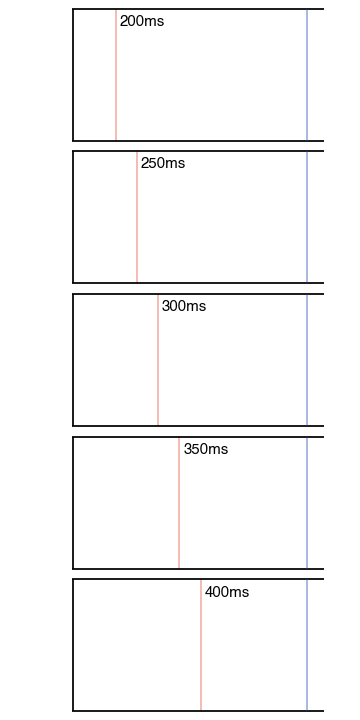
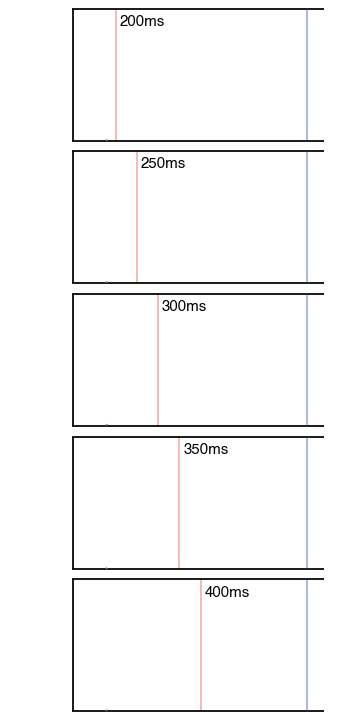
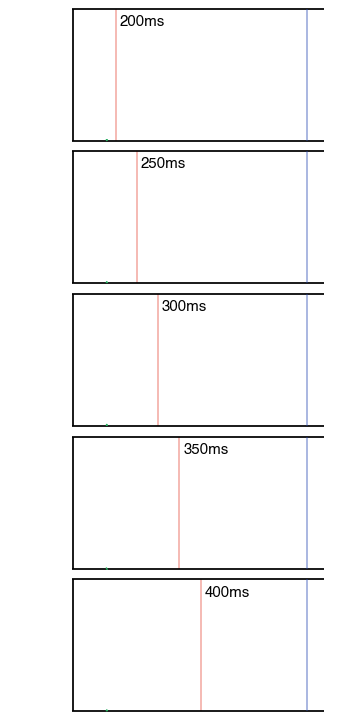
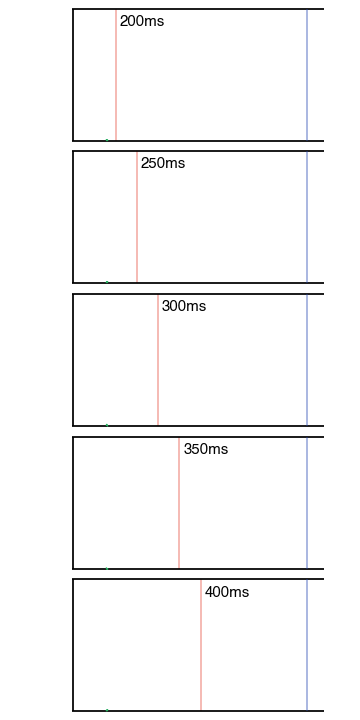
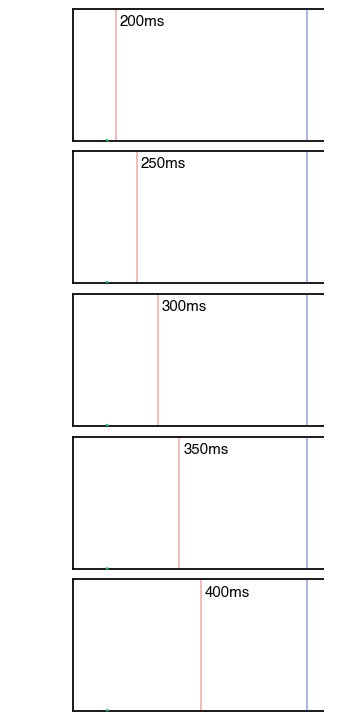
...
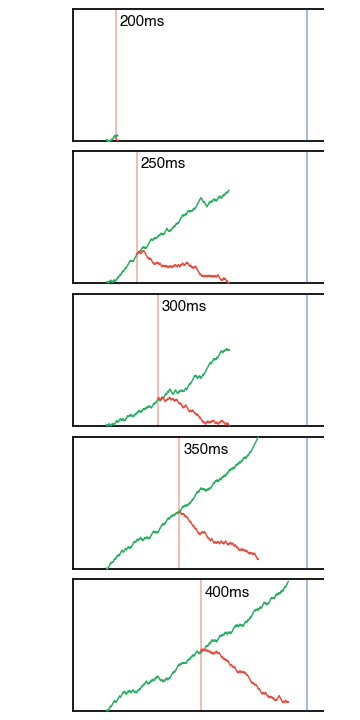
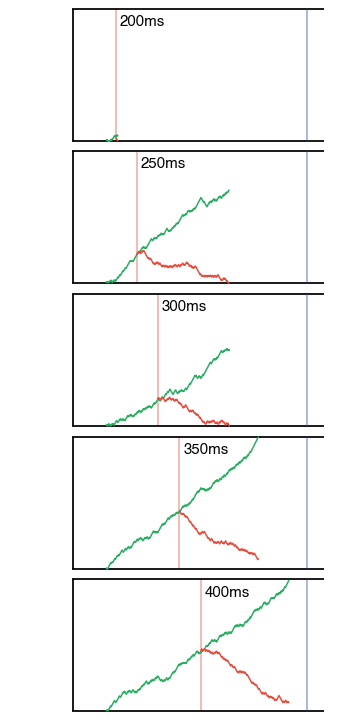
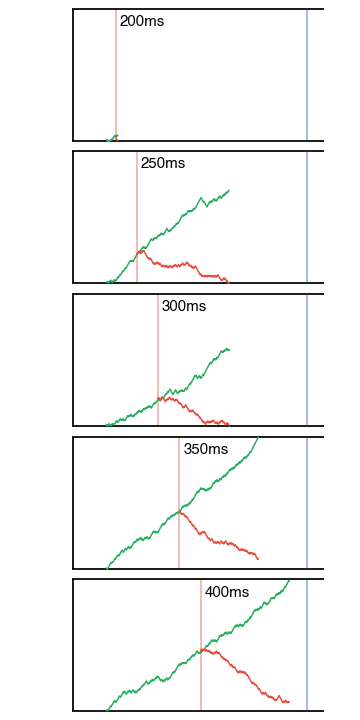
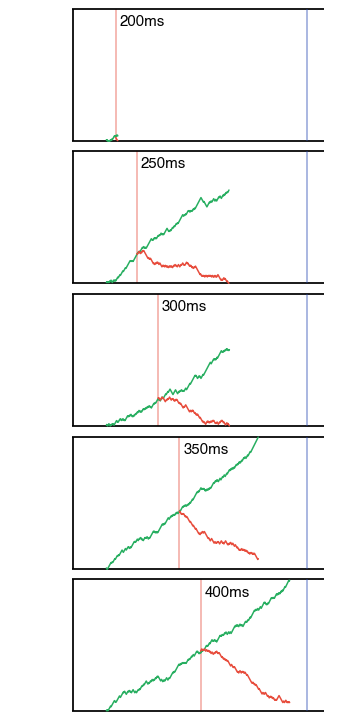
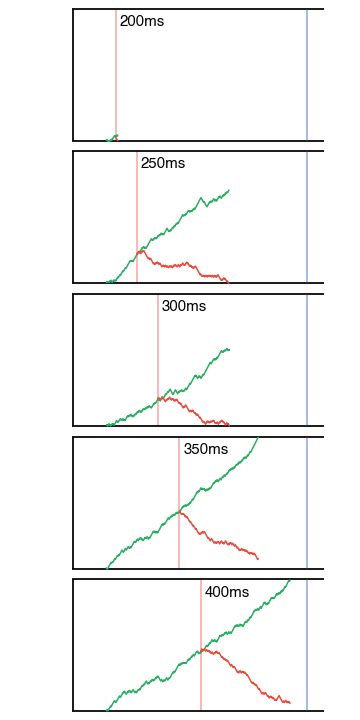

In [13]:
# Kindly ignore all of this nonsense 
x, gtraces, straces, xi, yi, nframes = vis.gen_re_traces(m, params)
f, axes = vis.build_decision_axis(onset=x[0][0], bound=bound)

glines = [axes[i].plot([], [], linewidth=1.5)[0] for i, n in enumerate(gtraces)]
slines = [axes[i].plot([xi[i]], [yi[i]], linewidth=1.5)[0] for i, n in enumerate(straces)]

# Choice/RT dependency on SSD and variability in execution process
# red vertical line shows the SSD, blue dotted line shows the trial deadline (ie. time boundary)
animation.FuncAnimation(f, vis.re_animate_multiax, fargs=(x, gtraces, glines, straces, slines, params, xi, yi), frames=nframes, interval=2, blit=True)

## view of model's "observed" dataframe

* **idx**: subject ID
* **Cond**: Baseline(bsl)/Caution(pnl) 
* **Go**: probability of a 'go' response on Go trials
* **200 - 400**: SSD conditions (in ms)
* **c10 - c90**: 10th - 90th RT quantiles for correct responses
* **e10 - e90**: 10th - 90th RT quantiles for error responses

In [9]:
m.observed.head()

,idx,Cond,Go,200,250,300,350,400,c10,c30,c50,c70,c90,e10,e30,e50,e70,e90
0,28,bsl,0.9917,1,1,0.95,0.60,0.00,0.5051,0.5319,0.5581,0.5664,0.5982,0.4961,0.5317,0.5319,0.5458,0.5674
1,28,pnl,0.9752,1,1,0.95,0.80,0.10,0.5177,0.5452,0.5718,0.5974,0.6119,0.5198,0.5452,0.5586,0.5718,0.6021
2,29,bsl,0.9917,1,1,1.00,0.90,0.00,0.5250,0.5451,0.5585,0.5720,0.5984,0.5268,0.5451,0.5585,0.5709,0.5902
3,29,pnl,0.9669,1,1,1.00,0.75,0.35,0.5314,0.5600,0.5850,0.5985,0.6250,0.5314,0.5448,0.5517,0.5751,0.5980
4,30,bsl,0.9421,1,1,1.00,0.80,0.25,0.5298,0.5719,0.5981,0.6118,0.6384,0.5361,0.5606,0.5854,0.6098,0.6208


### Optimize DPM to the mean data (10 subjects; drift-rate free between Baseline/Caution) 

In [633]:
# set liberal opt. criteria for demo purposes
# multiopt to True in order to perform global
# optimization using basinhopping algorithm 
# (starting from two randomly sampled initial
# parameter sets)

m.optimize(maxfev=500, tol=1.e-2, multiopt=True, nrand_inits=2)

Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 28
         Function evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 19
         Function evaluations: 32


In [634]:
m.fitinfo

a           0.53865
chi       0.0032757
cnvrg          True
ndata            32
nfev             32
nvary             2
ssv         -1.1063
tr          0.17278
v_bsl        1.2987
v_pnl        1.2506
xb           0.9048
df               30
rchi     0.00010919
logp        -291.92
AIC         -287.92
BIC         -287.76
dtype: object

### Examine fits

In [ ]:
# fitting a model automatically saves a .txt
# summary of the fit results to the working dir
# (see xdpm_v_fit_report.txt)

# the fit summary (goodness of fit measures, etc.) 
# is also available in fitinfo attribute 
m.fitinfo
#best-fit parameter estimates (popt attribute)
m.popt
# model's behavioral predictions (fits attribute)
m.fits

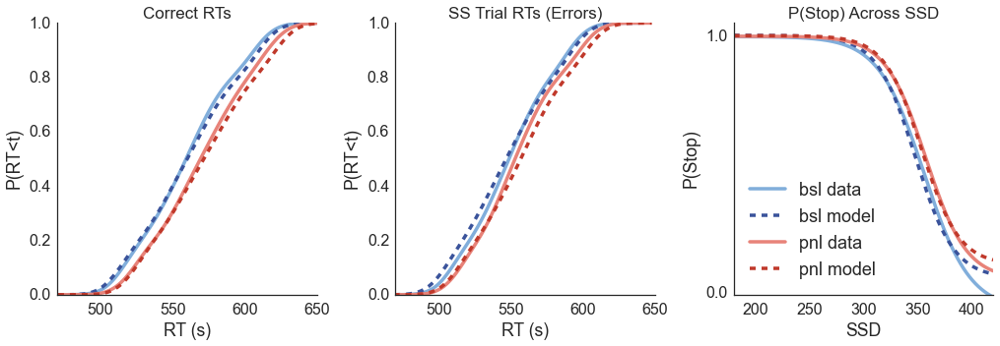

In [639]:
sns.set(style='white')
vis.plot_reactive_fits(m)

# Proactive (coming soon...)

In [ ]:
# read in dataframe from demo dir (10 example subjects)
prodat=pd.read_csv(pth+'proactive_example_idx.csv')
# Go trial probability conditions in 'pGo' column
prodat.head()

In [626]:
m = build.Model(kind='xpro', data=prodata, depends_on={'a':'pGo'})
#m.optimize(maxfev=500, tol=1.e-2, multiopt=True)